# 2024-026 Tcf7+D8 vs Naive Regions Analysis

This notebook is an exploration on the similarity of Runx3-responsive regions to naive regions.

## Initialize Environment

In [1]:
# Load necessary packages
library(tidyr)
library(dplyr)
library(ggplot2)
library(viridis)

# Set the working directory
setwd("/home/dalbao/2024-026-Tcf7ATAC/02_bp_notebooks")

daps_comparison <- "daps/241231-bp-reAnalysis-DPF-DAPS.csv"
specific_comparison <- "GFPpos_d8"
p_filter_master <- 0.1
log2FC_filter_master <- 0



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite



In [2]:
# Load data
da_daps <- read.csv("daps/241231-bp-DAnST-DAPS-Unannotated.csv")
df_daps <- read.csv(daps_comparison)

table(da_daps$comparison)
table(df_daps$comparison)


               CX3CR1pos_shCD19   CX3CR1pos_shCD19_vs_D5_shCD19 
                          47192                           45362 
              CX3CR1pos_shRunx3 CX3CR1pos_shRunx3_vs_D5_shRunx3 
                          47192                           47192 
    CX3CR1pos_shRunx3_vs_shCD19             CX3CR1pos_vs_GFPneg 
                          30723                           47192 
            CX3CR1pos_vs_GFPpos            D5_shRunx3_vs_shCD19 
                          47192                           40787 
                  GFPneg_shCD19      GFPneg_shCD19_vs_D5_shCD19 
                          47192                           47192 
                 GFPneg_shRunx3    GFPneg_shRunx3_vs_D5_shRunx3 
                          47192                           45362 
       GFPneg_shRunx3_vs_shCD19                GFPneg_vs_GFPpos 
                          34383                           47192 
                  GFPpos_shCD19      GFPpos_shCD19_vs_D5_shCD19 
                        


              GFPneg_d28  GFPneg_d28_vs_GFPneg_d8                GFPneg_d8 
                   47160                    47160                    47160 
              GFPpos_d28 GFPpos_d28_vs_GFPneg_d28  GFPpos_d28_vs_GFPpos_d8 
                   47160                    47160                    47160 
               GFPpos_d8   GFPpos_d8_vs_GFPneg_d8 
                   47160                    47160 

In [3]:
# Limit the scope of the comparison
da_daps <- da_daps[grepl("shRunx3_vs_", da_daps$comparison) & !(grepl("D5", da_daps$comparison)), ]
df_daps <- df_daps[df_daps$comparison == specific_comparison, ]

table(da_daps$comparison)
table(df_daps$comparison)


CX3CR1pos_shRunx3_vs_shCD19    GFPneg_shRunx3_vs_shCD19 
                      30723                       34383 
   GFPpos_shRunx3_vs_shCD19           shRunx3_vs_shCD19 
                      39872                       46277 


GFPpos_d8 
    47160 

# Processing

In [4]:
# Identify differentially accessible peaks in the DA experiment
# Then, create a column called change that indicates the direction of the change
# if log2FC > 0, change = "closed"
# if log2FC < 0, change = "opened"
# Then, keep only the comparison, name and change columns
# Lastly, make a new column called set that pastes the values of comparison and change
da_daps <- da_daps %>%
    filter(padj < p_filter_master) %>%
    filter(abs(log2FC) > log2FC_filter_master) %>%
    mutate(change = ifelse(log2FC > 0, "closed", "opened")) %>%
    mutate(set = paste(comparison, change, sep = "_")) %>% 
    select(set, name)

head(da_daps)

# Select only name, log2FC and padj columns of df_daps
df_daps <- df_daps %>%
    select(name, log2FC, padj)

head(df_daps)

,set,name
,<chr>,<chr>
1,shRunx3_vs_shCD19_closed,Interval_268847
2,shRunx3_vs_shCD19_closed,Interval_214810
3,shRunx3_vs_shCD19_closed,Interval_263547
4,shRunx3_vs_shCD19_closed,Interval_102482
5,shRunx3_vs_shCD19_closed,Interval_103538
6,shRunx3_vs_shCD19_closed,Interval_268772


,name,log2FC,padj
,<chr>,<dbl>,<dbl>
1,Interval_62847,3.590048,2.490690e-153
2,Interval_32205,3.365807,9.692917e-148
3,Interval_229397,5.368818,3.372048e-143
4,Interval_181210,4.417225,4.143355e-127
5,Interval_150307,3.738547,2.050118e-115
6,Interval_76722,3.780924,1.163366e-114


## Ploting

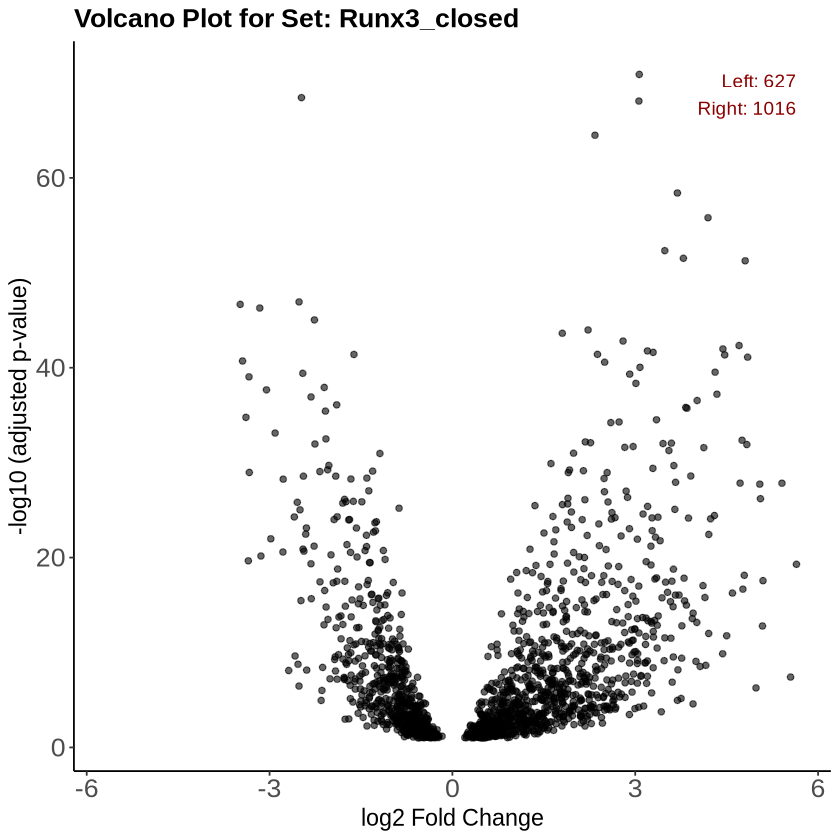

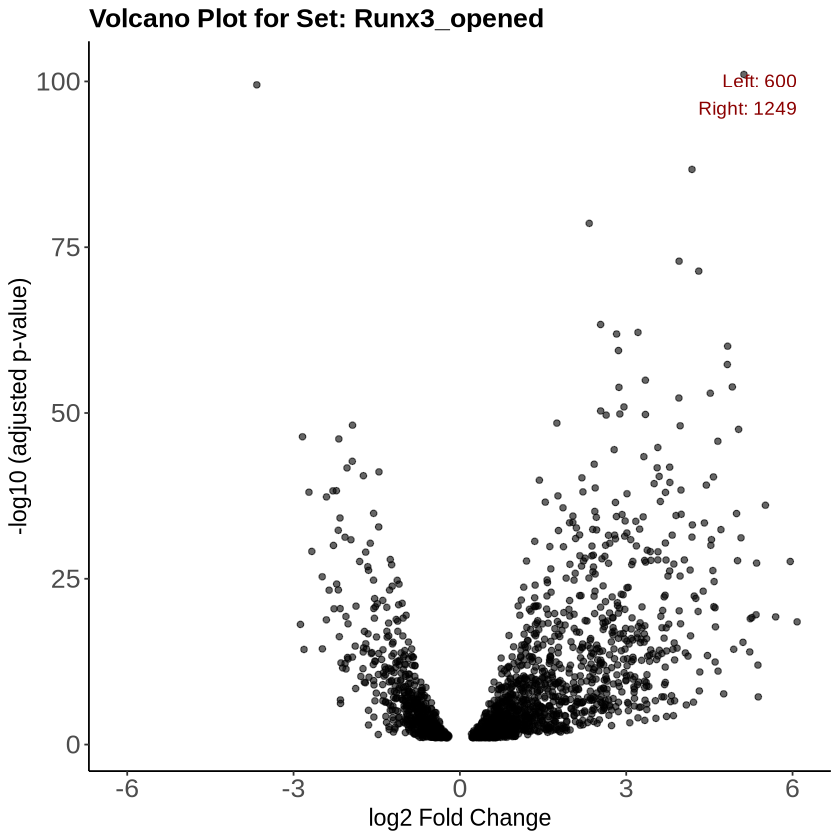

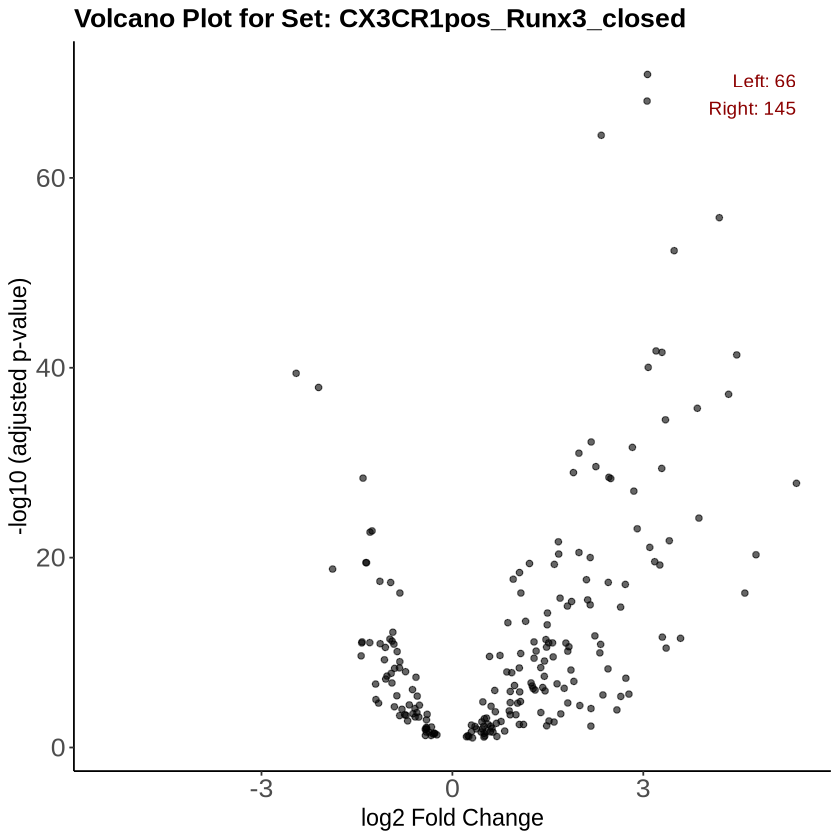

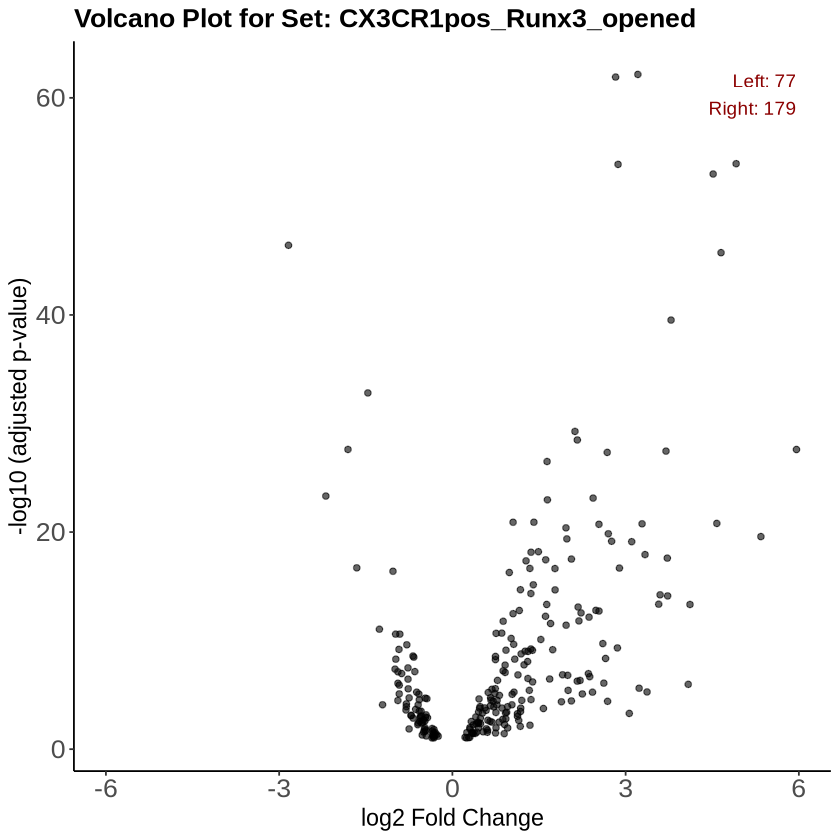

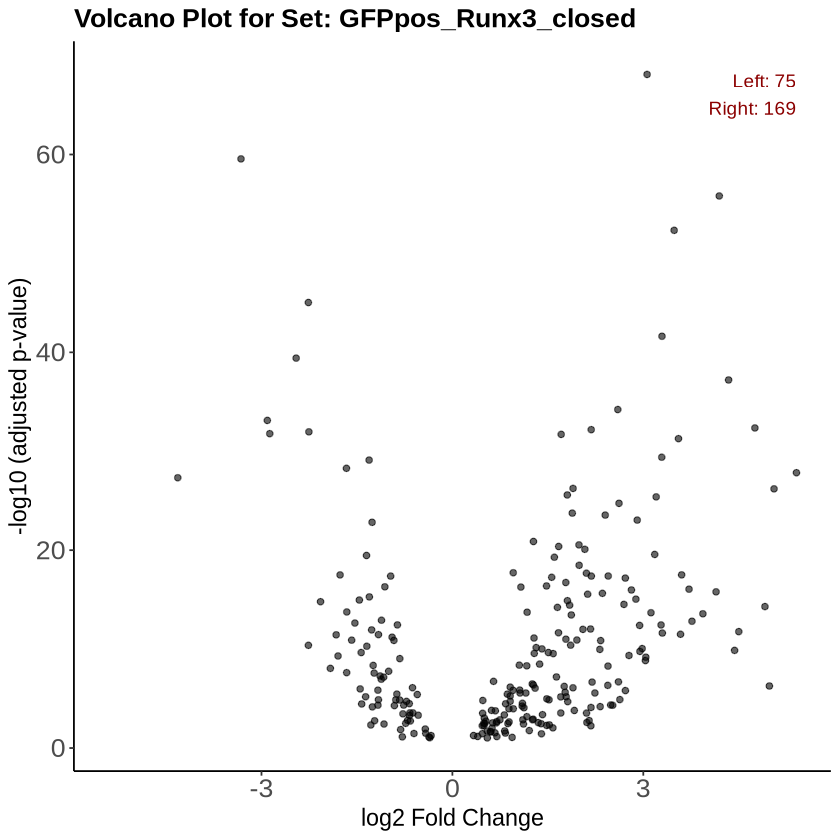

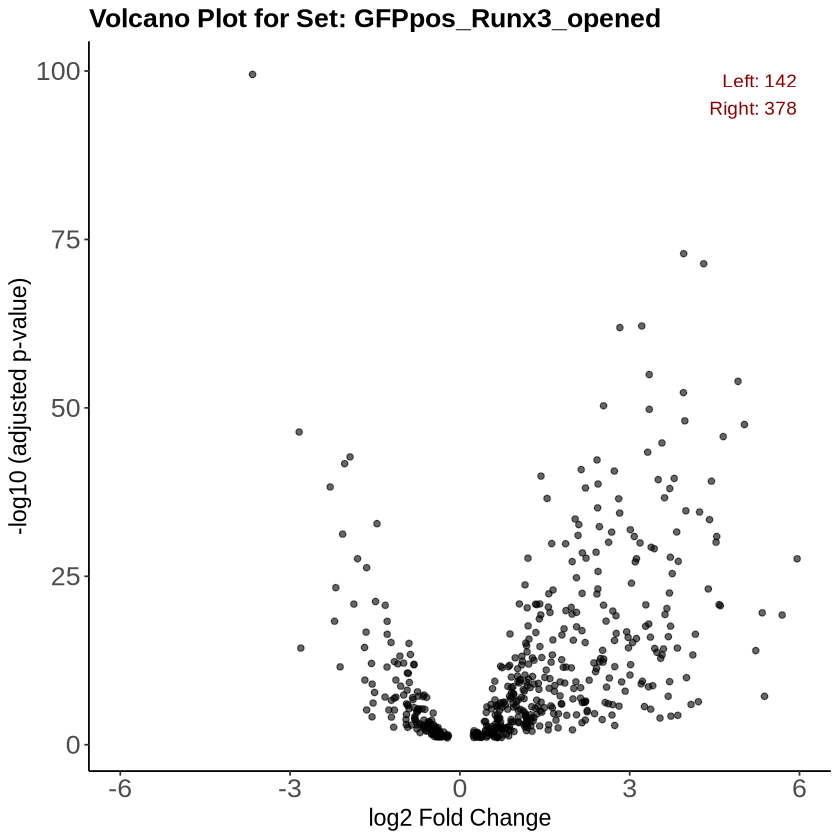

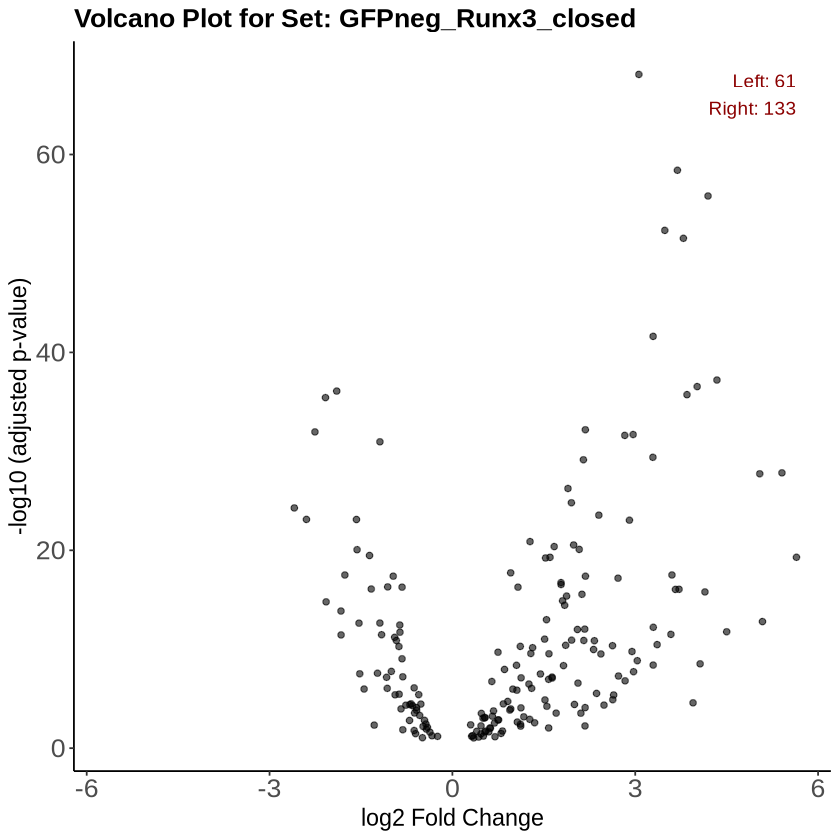

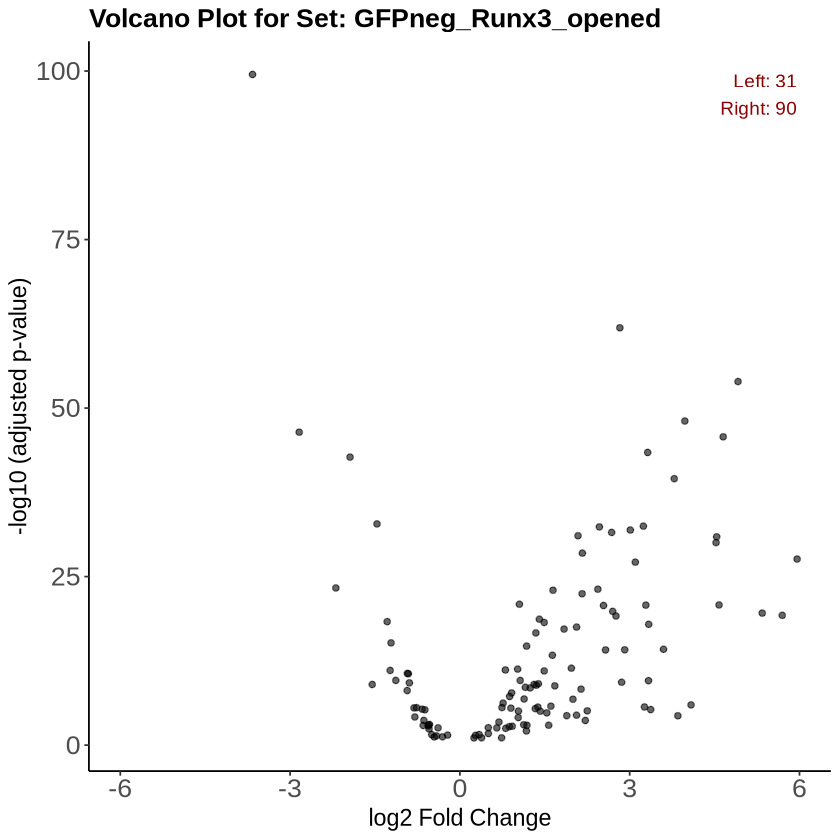

In [5]:
plot_volcano <- function(peak_set, daps, p_filter = p_filter_master, log2FC_filter = log2FC_filter_master, title_addendum = "") {
    # -----------------------------------------------------------
    # 1) Identify unique sets in peak_set
    # -----------------------------------------------------------
    unique_sets <- unique(peak_set$set)

    # -----------------------------------------------------------
    # 2) For each set, create a volcano plot of daps 
    #    (subset to only peaks in that set) and annotate 
    #    left/right counts
    # -----------------------------------------------------------
    for (s in unique_sets) {

        # ---------------------------------------------------------
        # 2a) Extract the peak names for the current set
        # ---------------------------------------------------------
        peaks_in_set <- peak_set %>%
            filter(set == s) %>%
            pull(name)

        # ---------------------------------------------------------
        # 2b) Subset daps to retain only these peaks and filter for significance
        # ---------------------------------------------------------
        daps_subset <- daps %>%
            filter(name %in% peaks_in_set) %>%
            filter(padj < p_filter) %>%
            filter(abs(log2FC) > log2FC_filter)

        # If there are no peaks in daps for this set, skip plotting
        if (nrow(daps_subset) == 0) {
            cat("No peaks in daps for set:", s, "\n")
            next
        }

        # ---------------------------------------------------------
        # 2c) Count how many of these subsetted peaks have log2FC 
        #     on the left side (log2FC < 0) or right side (log2FC > 0)
        # ---------------------------------------------------------
        left_count  <- sum(daps_subset$log2FC < 0, na.rm = TRUE)
        right_count <- sum(daps_subset$log2FC > 0, na.rm = TRUE)

        # ---------------------------------------------------------
        # 2d) Create a volcano plot with these subsetted peaks only
        # ---------------------------------------------------------
        # x-axis: log2FC
        # y-axis: -log10(padj)
        # Each plot is titled with the current set identifier

        # Define the maximum x and y for annotation placement
        max_x <- max(abs(daps_subset$log2FC), na.rm = TRUE)
        max_y <- max(-log10(daps_subset$padj), na.rm = TRUE)

        # Prepare annotation text with left and right counts
        label_text <- paste0("Left: ", left_count, "\nRight: ", right_count)

        # Create the ggplot
        p <- ggplot(daps_subset, aes(x = log2FC, y = -log10(padj))) +
            geom_point(alpha = 0.6) +  # Scatter plot with slight transparency
            theme_classic() +
            labs(
            title = paste("Volcano Plot for Set:", gsub("shRunx3_vs_shCD19", "Runx3", s), title_addendum),
            x = "log2 Fold Change",
            y = "-log10 (adjusted p-value)"
            ) +
            # Annotate the plot with the left/right counts
            annotate(
            "text",
            x = max_x,
            y = max_y,
            label = label_text,
            hjust = 1,       # move text anchor to the right
            vjust = 1,       # move text anchor to the top
            size = 4,        # text size
            color = "darkred"  # text color changed to dark red
            ) +
            # Set the x-axis limits to be equal on both sides of 0
            xlim(-max_x, max_x) +
            theme(
                axis.text = element_text(size = 16),        # Adjust size of axis numbers
                axis.title = element_text(size = 14),       # Adjust size of axis labels
                plot.title = element_text(size = 16, face = "bold")  # Adjust size of plot title
            )

        # ---------------------------------------------------------
        # 2e) Print the plot
        # ---------------------------------------------------------
        print(p)
    }
}

# Implement
plot_volcano(da_daps, df_daps, p_filter = 0.1)

## Tcf7 Bound Peaks Analysis

Check the enrichment of Tcf7-bound Runx3-controlled peaks in Tcm vs naive.

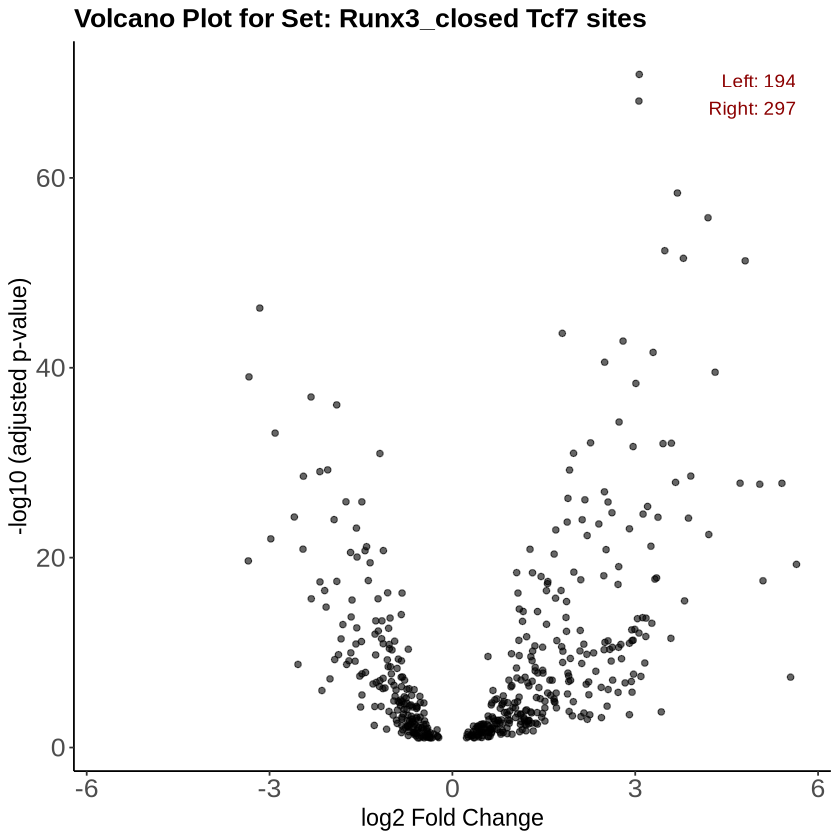

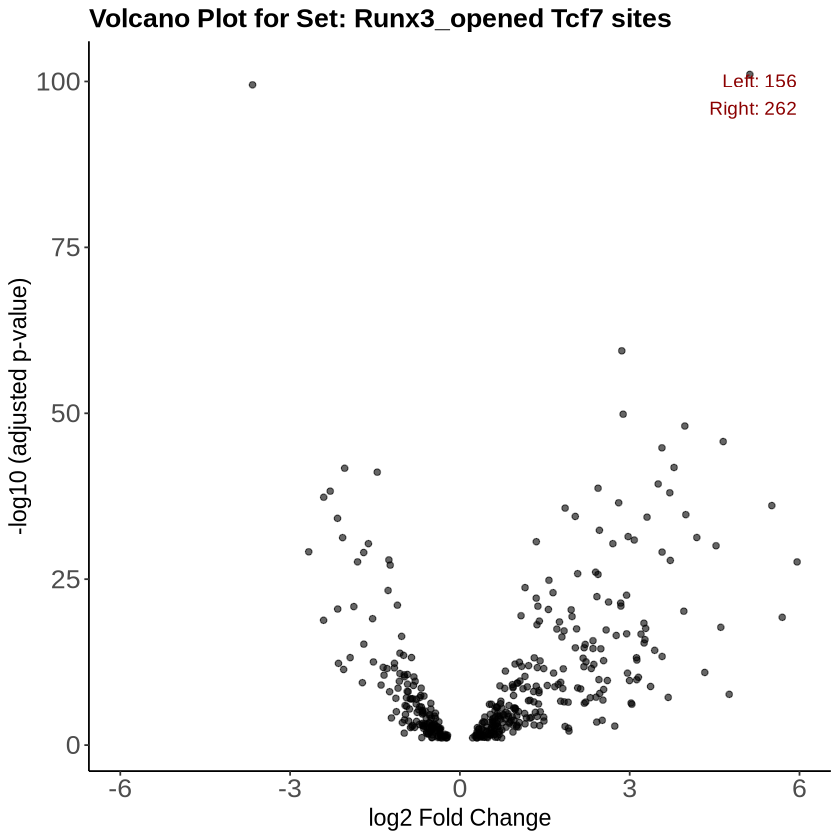

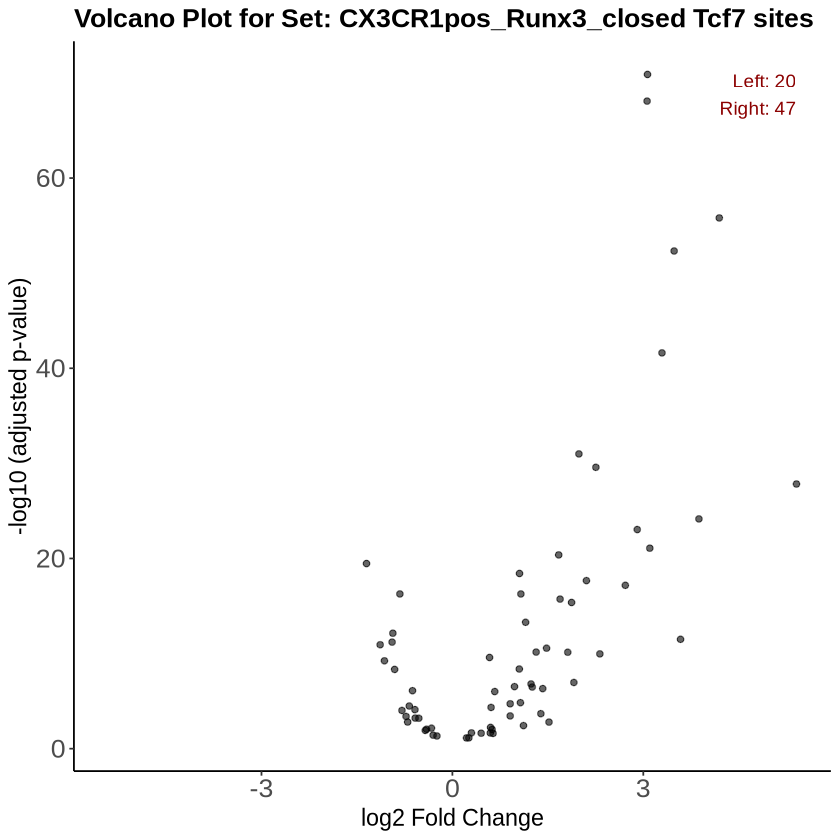

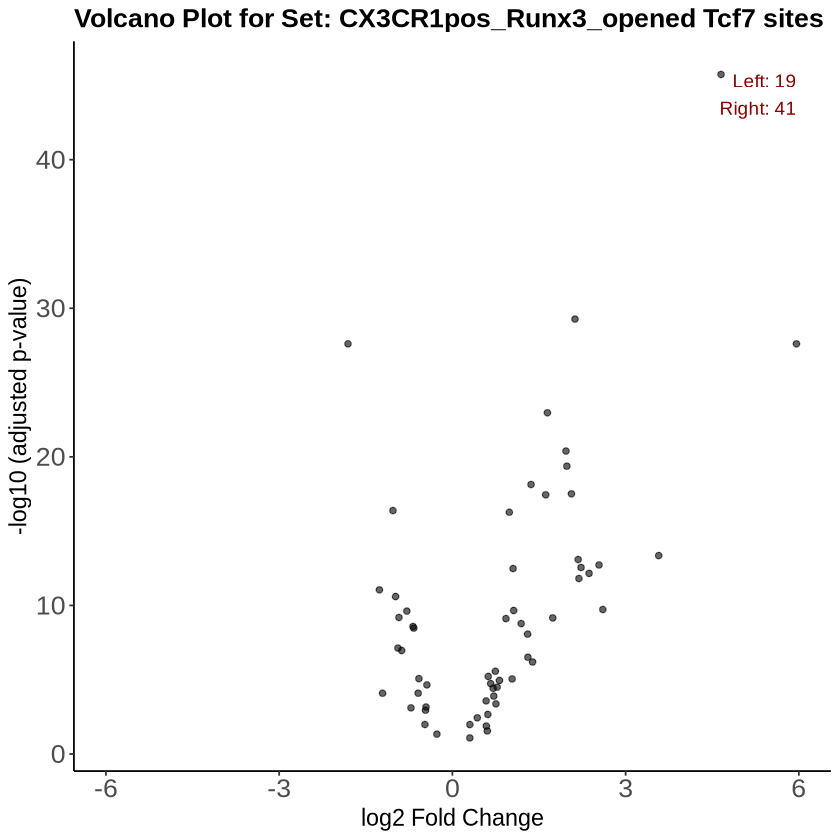

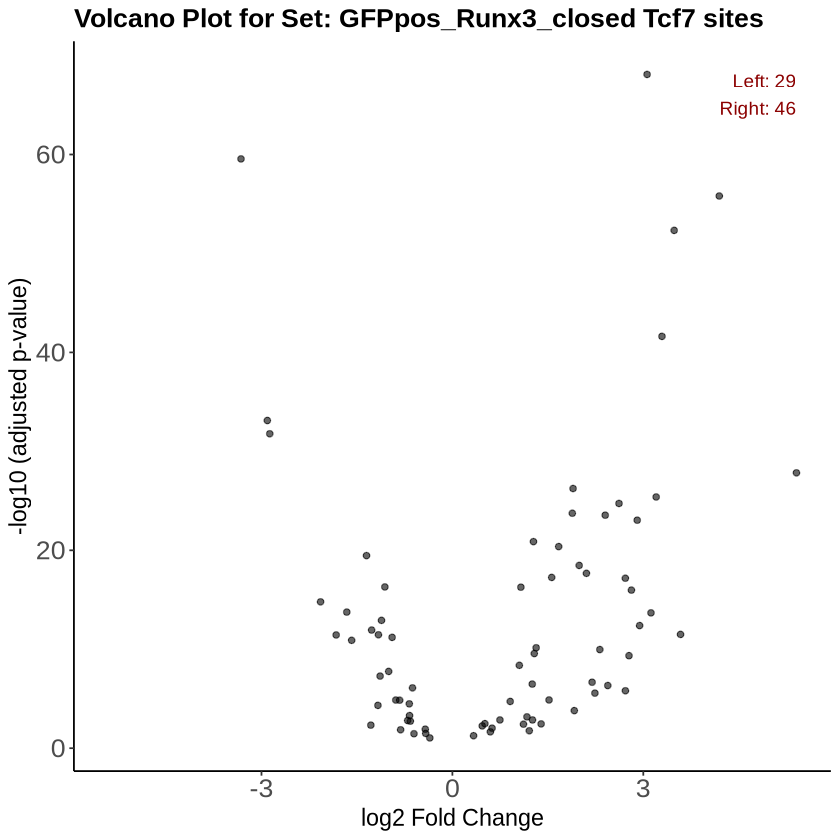

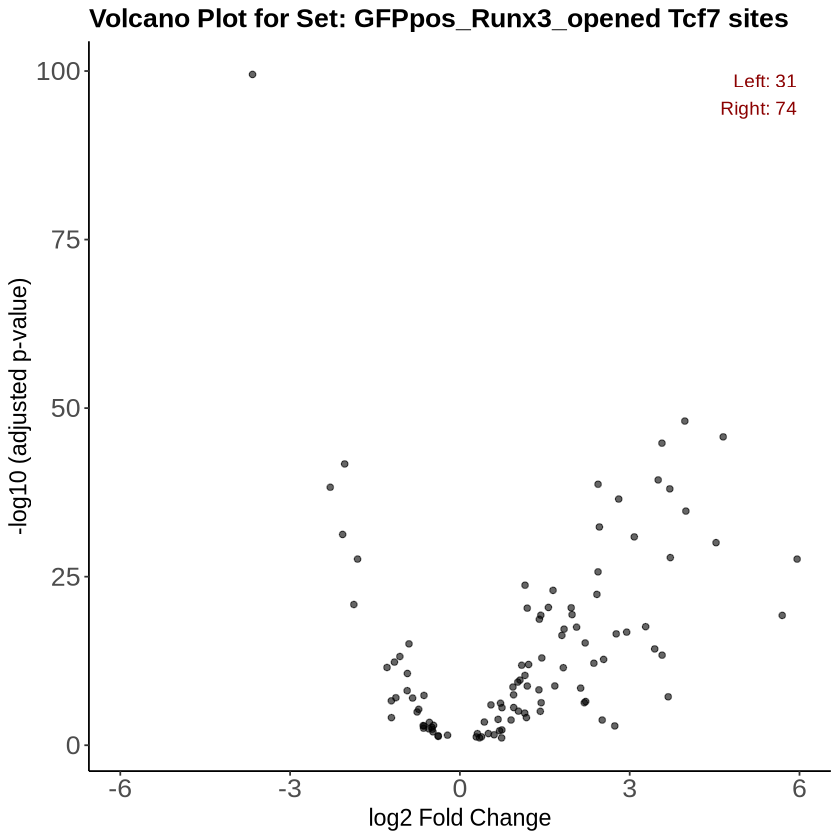

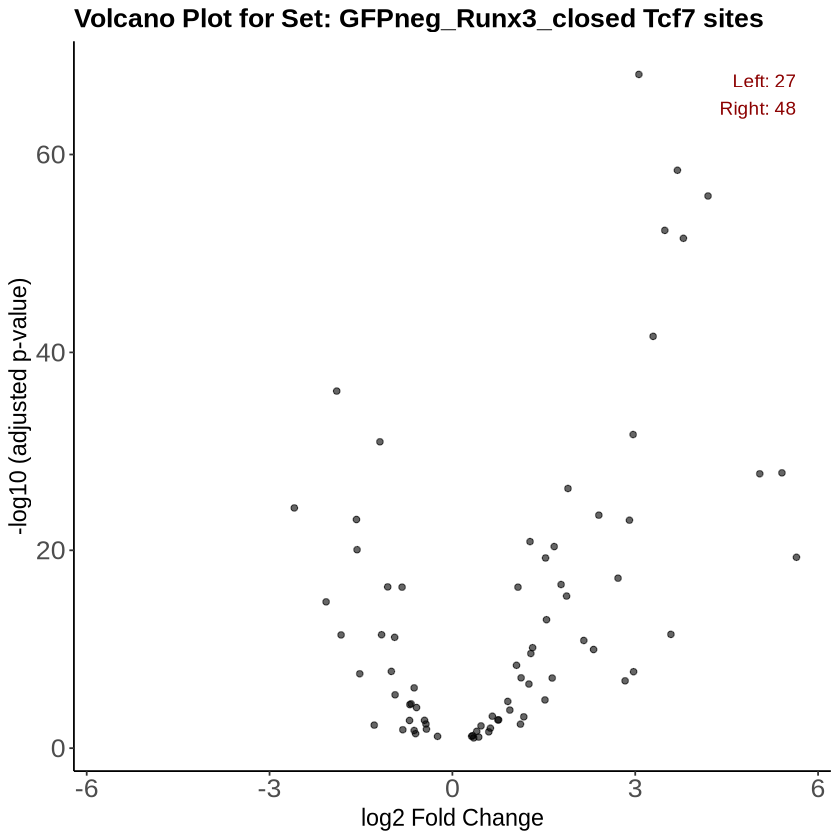

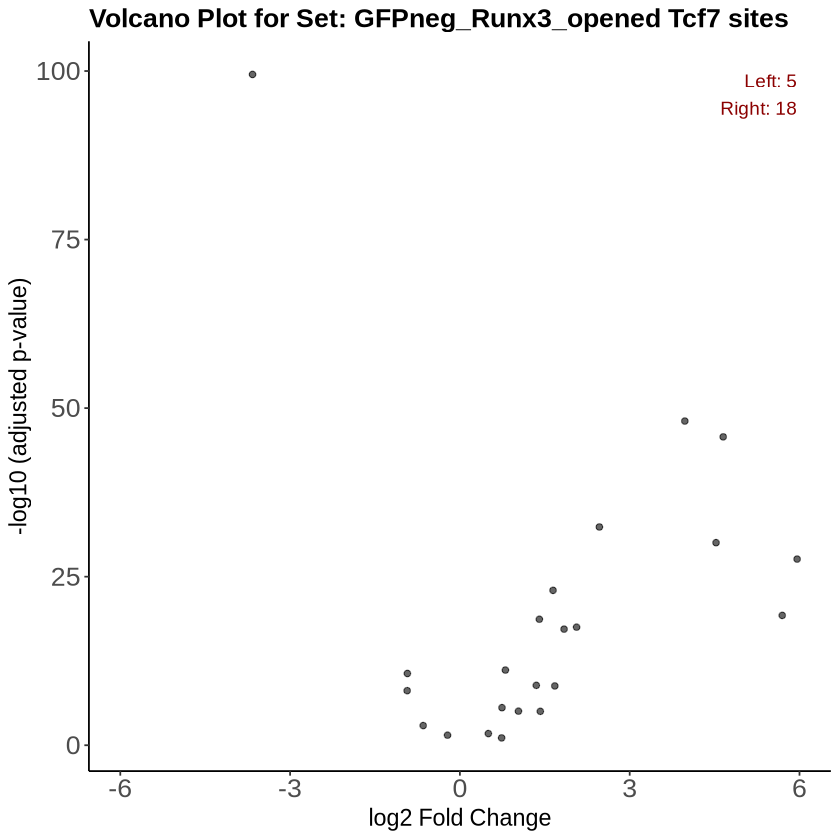

In [6]:
# This script reads a table of Tcf7 peaks from a specified file, renames the first column to "name",
# and extracts the "name" column as a vector.
# 
# 
# Steps:
# 1. Read the table from the file "../03_bp_homer/Tcf7_only.txt" with tab-separated values and a header.
# 2. Rename the first column of the table to "name".
# 3. Extract the "name" column from the table and store it in the variable `tcf7_peaks`.
tcf7_peaks <- read.table("../03_bp_homer/Tcf7_only.txt", sep = "\t", header = TRUE)
colnames(tcf7_peaks)[1] <- "name"
tcf7_peaks <- tcf7_peaks$name

# Select DAPS that have Tcf7 sites
da_daps_tcf7 <- da_daps %>%
    filter(name %in% tcf7_peaks)

# Implement
plot_volcano(da_daps_tcf7, df_daps, p_filter = 0.1, title_addendum = "Tcf7 sites")

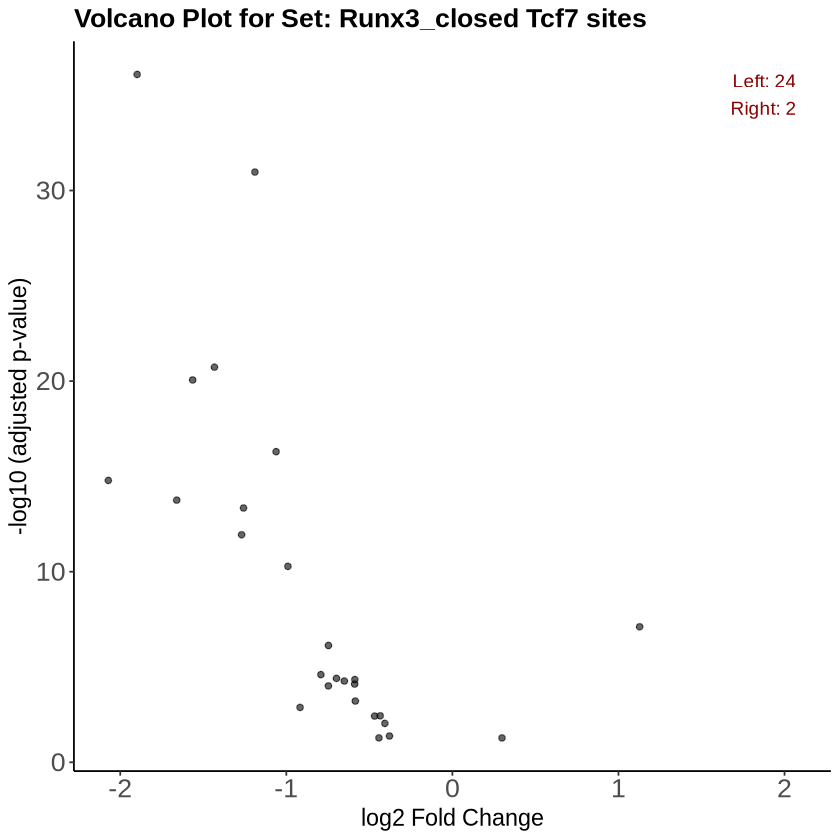

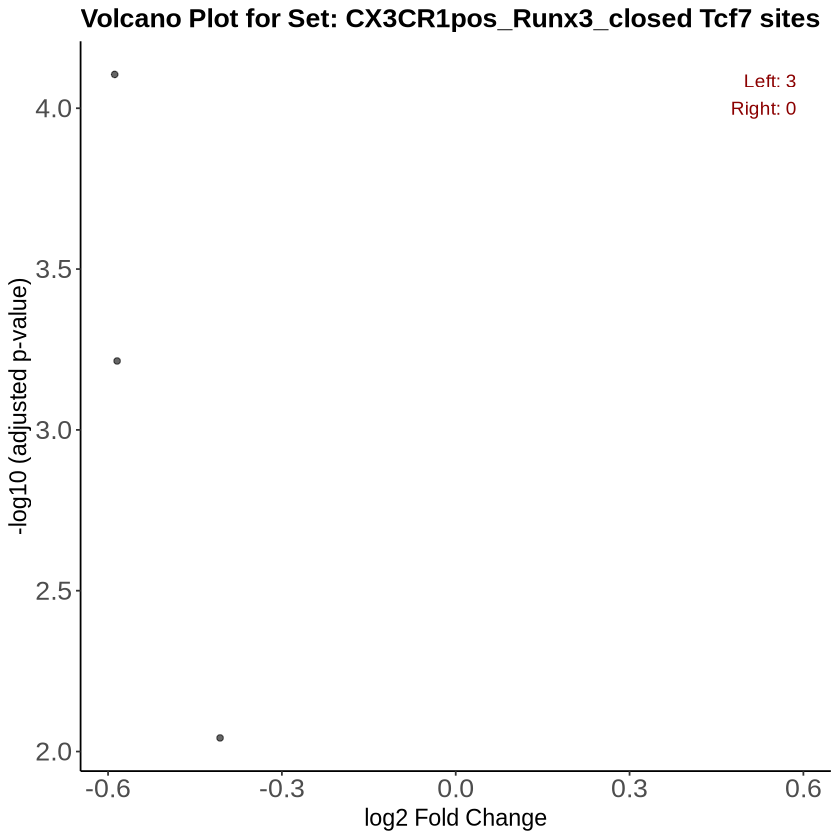

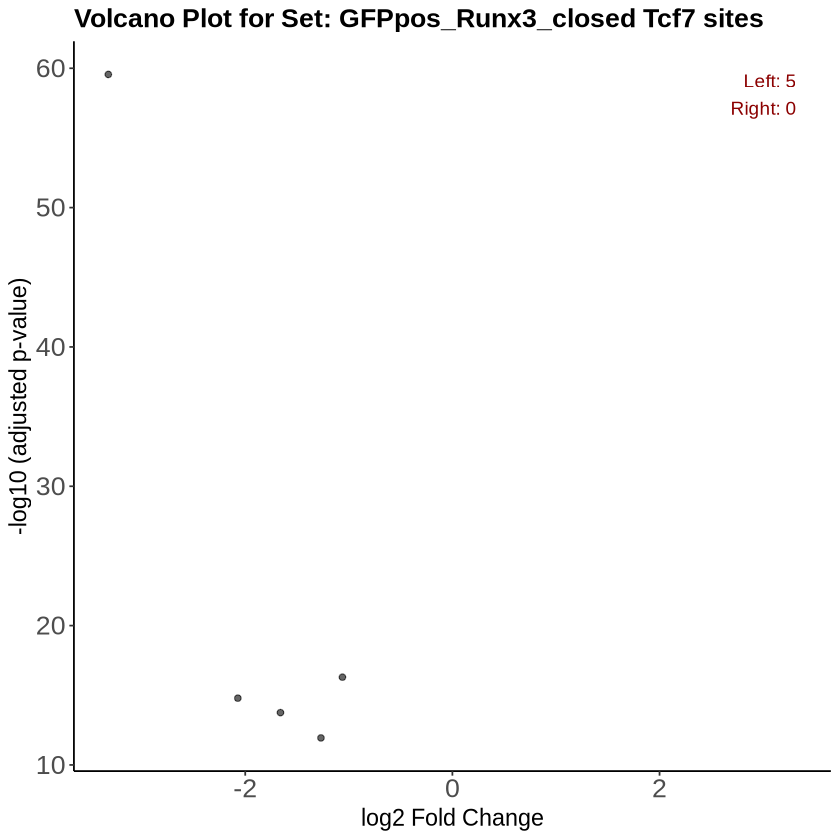

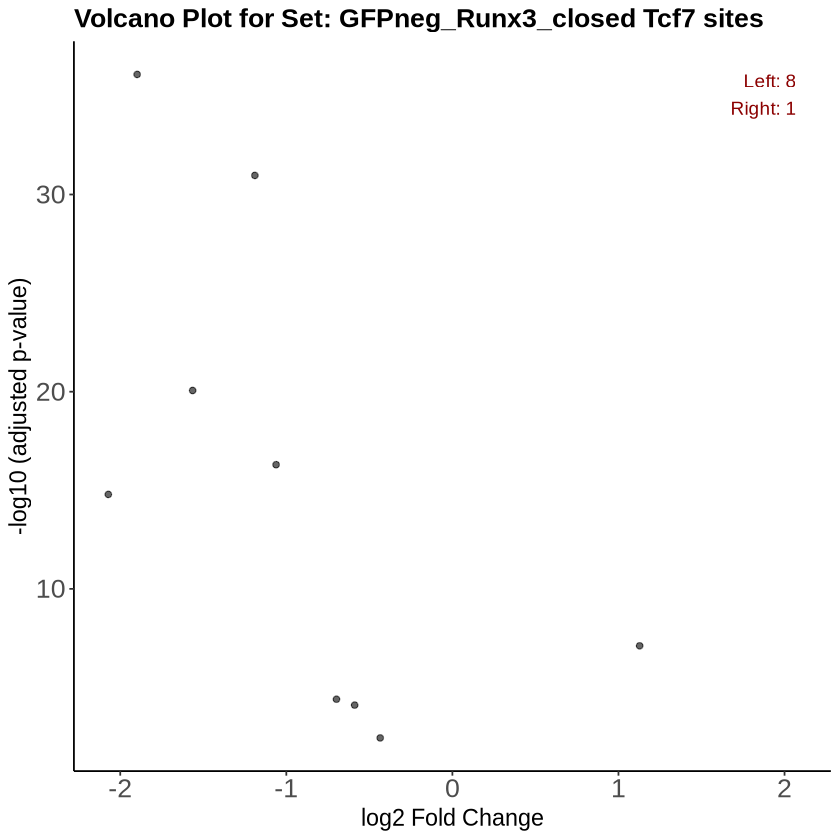

In [7]:
# This script reads a table of Tcf7 peaks from a specified file, renames the first column to "name",
# and extracts the "name" column as a vector.
# 
# 
# Steps:
# 1. Read the table from the file "../03_bp_homer/Tcf7_only.txt" with tab-separated values and a header.
# 2. Rename the first column of the table to "name".
# 3. Extract the "name" column from the table and store it in the variable `tcf7_peaks`.
tcf7_peaks <- read.table("../03_bp_homer/Tcf7_only.txt", sep = "\t", header = TRUE)
colnames(tcf7_peaks)[1] <- "name"
tcf7_peaks <- tcf7_peaks$name

leading_edge <- readLines("../03_bp_homer/etcm_effclosed_leading.txt")
tcf7_peaks <- tcf7_peaks[tcf7_peaks %in% leading_edge]

# Select DAPS that have Tcf7 sites
da_daps_tcf7 <- da_daps %>%
    filter(name %in% tcf7_peaks)

# Implement
plot_volcano(da_daps_tcf7, df_daps, p_filter = 0.1, title_addendum = "Tcf7 sites")

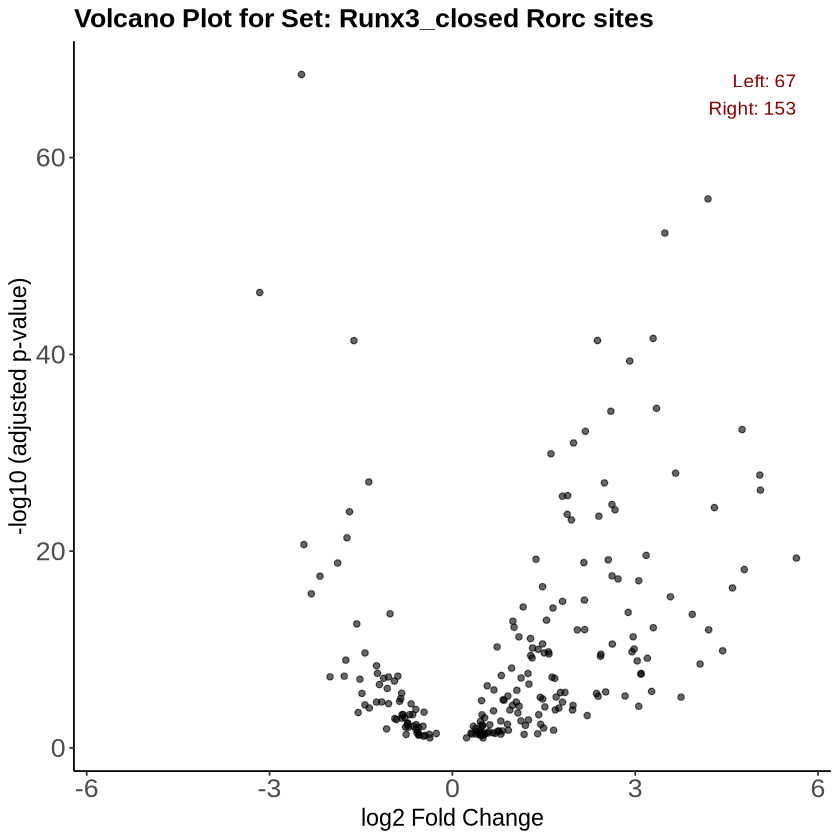

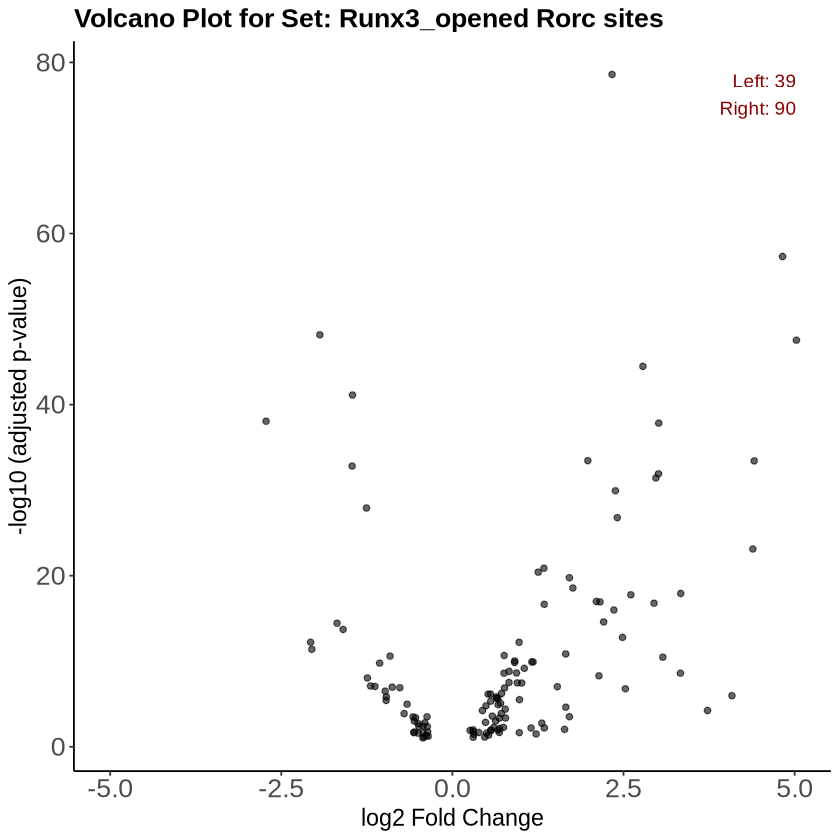

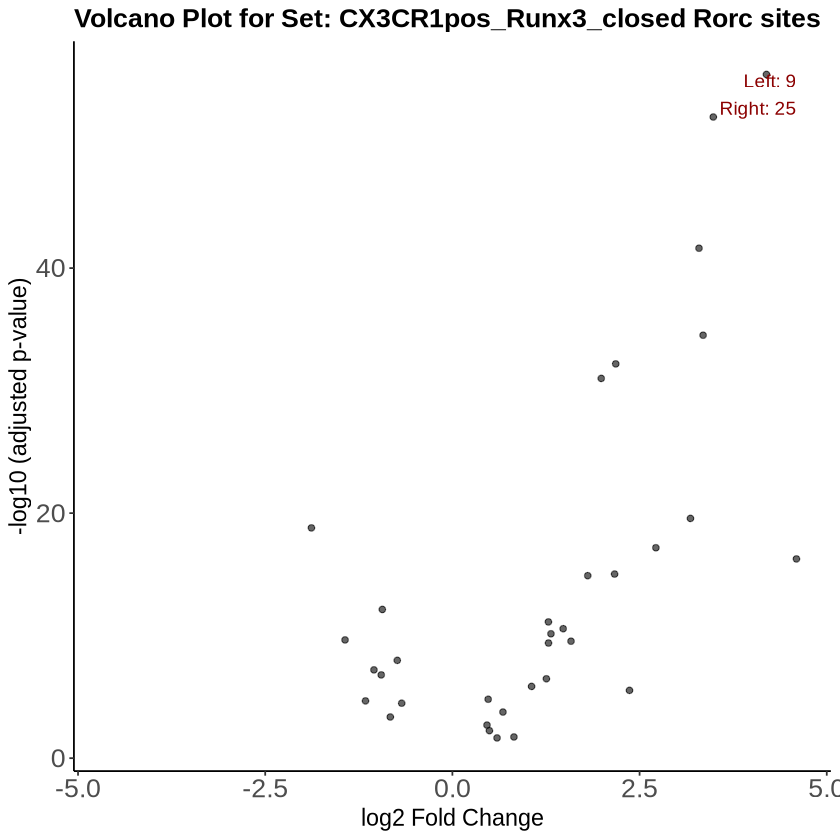

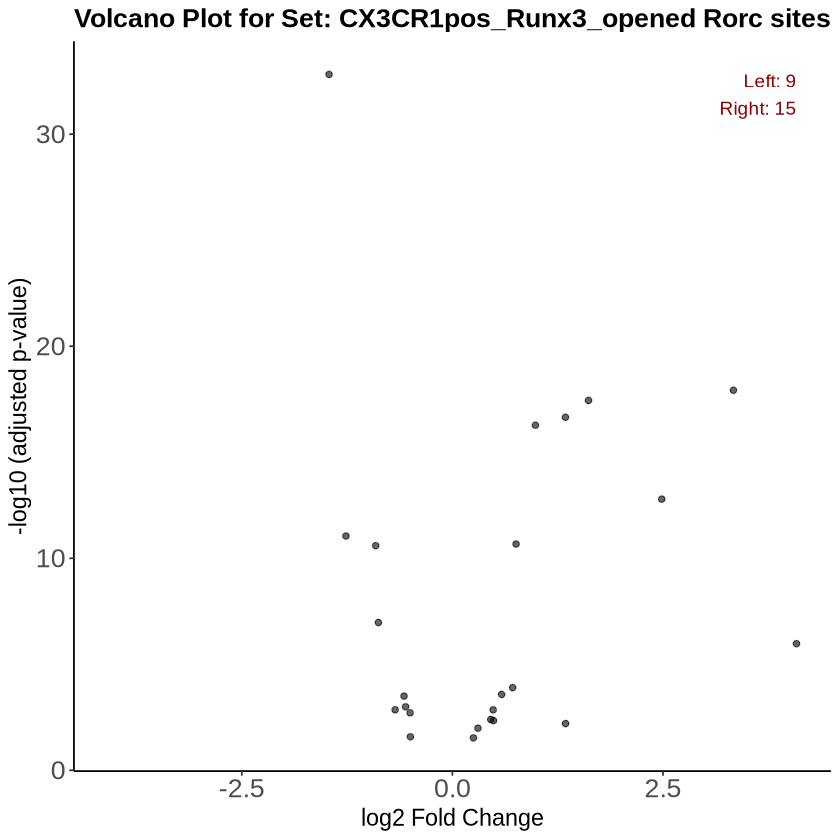

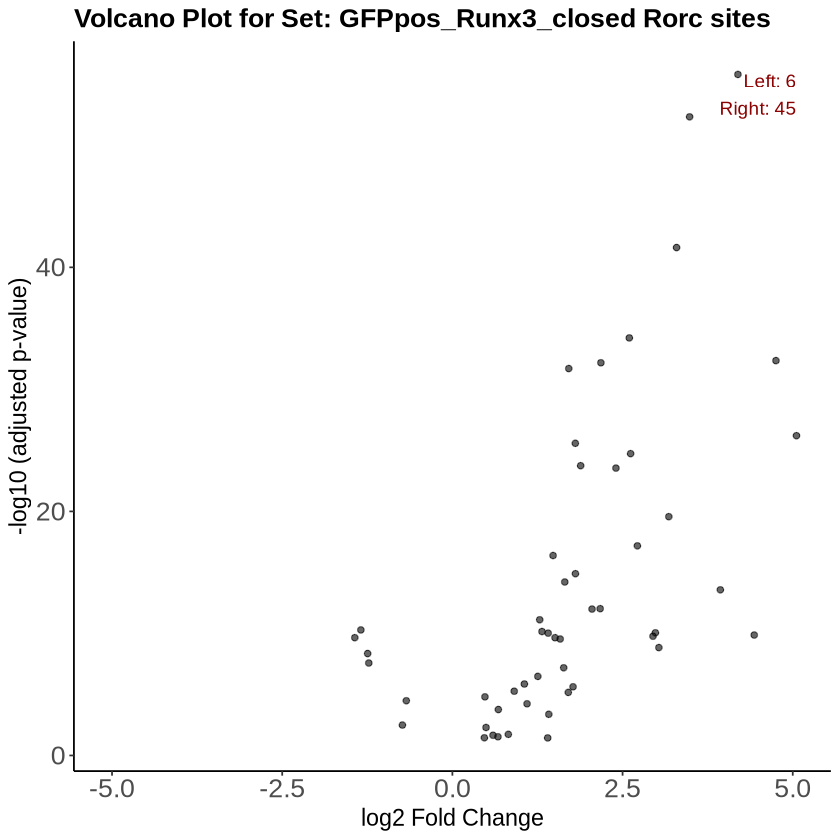

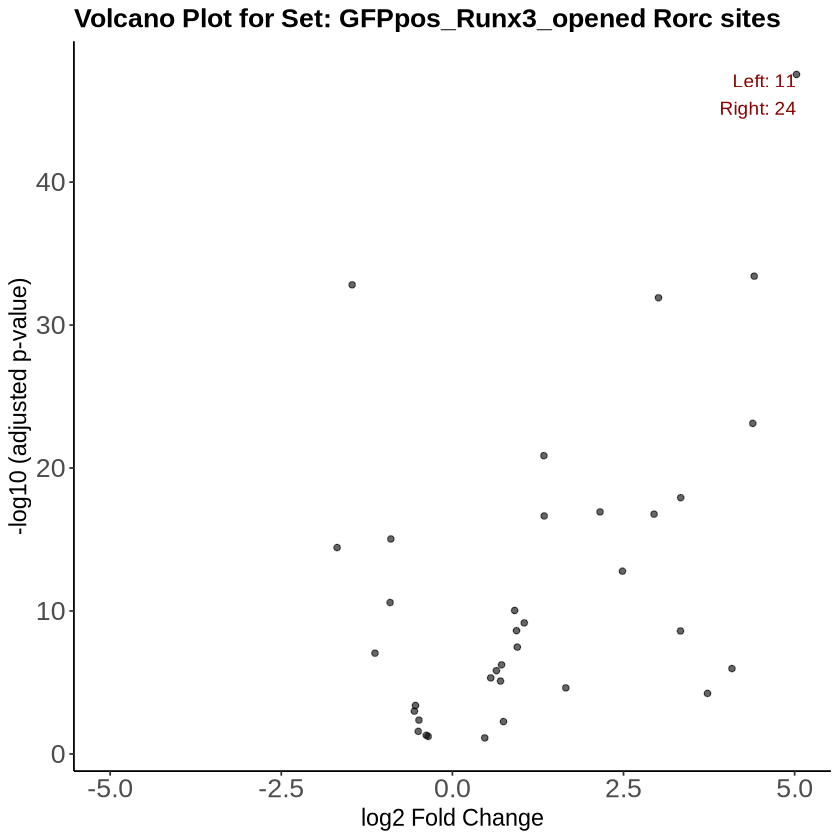

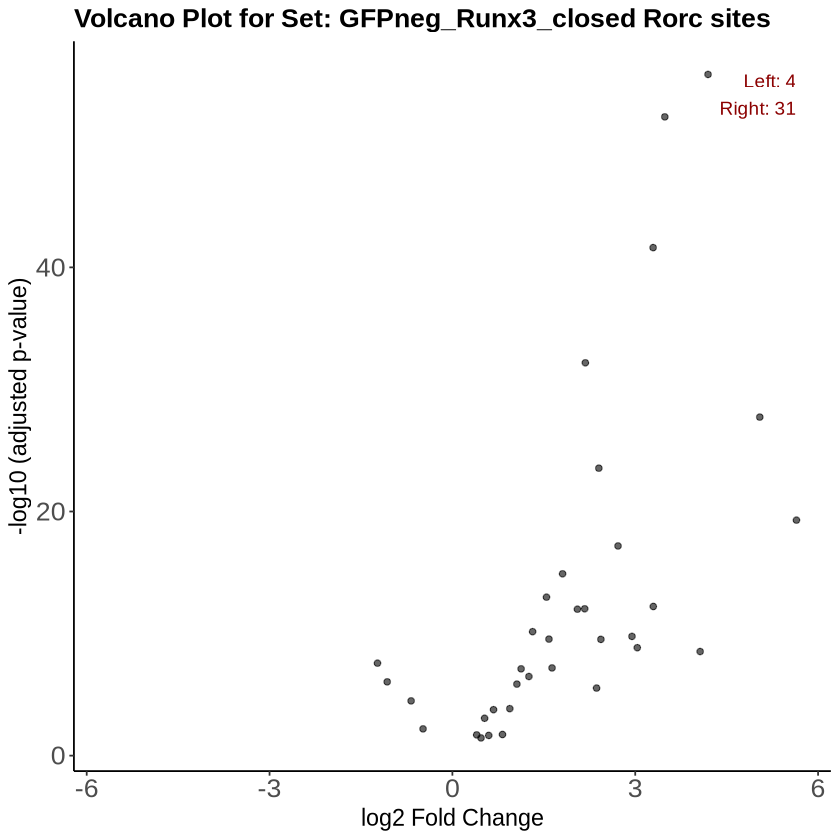

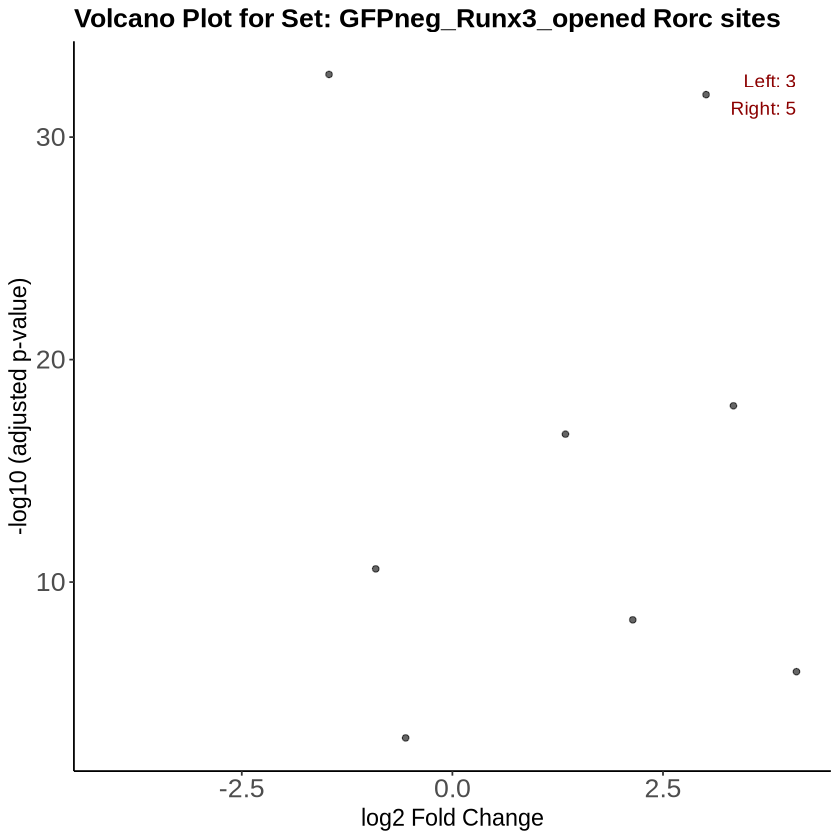

In [8]:
# This script reads a table of Tcf7 peaks from a specified file, renames the first column to "name",
# and extracts the "name" column as a vector.
# 
# 
# Steps:
# 1. Read the table from the file "../03_bp_homer/Tcf7_only.txt" with tab-separated values and a header.
# 2. Rename the first column of the table to "name".
# 3. Extract the "name" column from the table and store it in the variable `tcf7_peaks`.
rorc_peaks <- read.table("../03_bp_homer/Rorc_only.txt", sep = "\t", header = TRUE)
colnames(rorc_peaks)[1] <- "name"
rorc_peaks <- rorc_peaks$name

# Select DAPS that have Tcf7 sites
da_daps_rorc <- da_daps %>%
    filter(name %in% rorc_peaks)

# Implement
plot_volcano(da_daps_rorc, df_daps, p_filter = 0.1, title_addendum = "Rorc sites")

In [9]:
# Import necessary packages
library(ggplot2)
library(clusterProfiler)
library(DOSE)
library(scales)
library(viridis)
library(dplyr)




clusterProfiler v4.10.1  For help: https://yulab-smu.top/biomedical-knowledge-mining-book/

If you use clusterProfiler in published research, please cite:
T Wu, E Hu, S Xu, M Chen, P Guo, Z Dai, T Feng, L Zhou, W Tang, L Zhan, X Fu, S Liu, X Bo, and G Yu. clusterProfiler 4.0: A universal enrichment tool for interpreting omics data. The Innovation. 2021, 2(3):100141


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:stats’:

    filter


DOSE v3.28.2  For help: https://yulab-smu.top/biomedical-knowledge-mining-book/

If you use DOSE in published research, please cite:
Guangchuang Yu, Li-Gen Wang, Guang-Rong Yan, Qing-Yu He. DOSE: an R/Bioconductor package for Disease Ontology Semantic and Enrichment analysis. Bioinformatics 2015, 31(4):608-609



Attaching package: ‘scales’


The following object is masked from ‘package:viridis’:

    viridis_pal




In [10]:
results_df <- read.csv("psea/250102-bp-DAnST-PSEA.csv")

In [11]:
# Calculate negative logarithm of q-value
results_df$log_qvalue <- -log10(results_df$BH)

# Filter significant q-values
significant_df <- subset(results_df, BH < 0.05)

In [12]:
plotGSEAbubble <- function(df, name){
    # Define color scale
    color_scale <- viridis::cividis(3)  # Generate a color scale with 2 colors

    # Ensure limits are symmetric around 0
    NES_range <- range(df$NES, na.rm = TRUE)
    max_abs_NES <- max(abs(NES_range))
    limits <- c(-max_abs_NES, max_abs_NES)

    # Create bubble plot
    p <- ggplot(df, aes(x = cluster, y = ID)) +
      geom_point(aes(color = NES, size = log_qvalue)) +
      scale_color_gradientn(
        colors = color_scale,
        limits = limits,
        guide = guide_colorbar(title = "NES")
      ) +
      scale_size_continuous(
        breaks = seq(0, max(df$log_qvalue), by = 0.5),
        labels = seq(0, max(df$log_qvalue), by = 0.5),
        guide = guide_legend(title = "-log10(Q-value)")
      ) +
      labs(
        title = paste("Gene Set Enrichment", name),  # Set the plot title
        x = "Cluster",  # Label for the X-axis
        y = "ID"  # Label for the Y-axis
      ) +
      theme_minimal() +  # Set the plot theme to minimal
      theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate and align X-axis labels
    return(p)
}

In [13]:
shRunx3_vs_shCD19 <- significant_df[((grepl("shRunx3_vs", significant_df$cluster)) & !(grepl("D5", significant_df$cluster))), ]
pdf("test.pdf")
print(plotGSEAbubble(shRunx3_vs_shCD19, "shRunx3 vs shCD19"))
dev.off()

png 
  2

In [14]:
pdf("test2.pdf")
subset_vs_naive   <- significant_df[!(grepl("_vs_", significant_df$cluster)), ]
print(plotGSEAbubble(subset_vs_naive, "Subset vs Naive"))
dev.off()

png 
  2

In [16]:
(32.87 - 21.01)/21.01 * 100

[1] 56.44931

In [ ]:
(21.73 - 15.62) / 15.